### Problem Statement 

A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 
Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.
Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.
We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 
They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 
They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 
The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers.


### Our Exercise

Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.  

#### Importing the libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

#### Loading the dataset

In [2]:
pd.set_option('display.max_rows',None)   #displaying the maximum rows
pd.set_option('display.max_columns',None)   #displaying the maximum columns
df=pd.read_csv(r'F:\Internship - Data Science\Micro-Credit-Project--1-\Micro Credit Project\Data file.csv')
df.head()   #first five rows of the dataset

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [3]:
df.tail()  #last five rows of the dataset

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,1.0,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.0,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.0,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.0,10.500000,UPW,2016-07-25
209592,209593,1,65061I85339,1581.0,4489.362000,4534.820000,483.92,631.20,13.0,0.0,7526,2,1.0,9065.0,4532.5,356.70,3,19,16591,7526.0,392.20,0.0,0.0,0,0,2,18,12.0,0.0,2.0,18,12,0.0,0.0,0.000000,UPW,2016-07-07


### Data Description

Variable	                                  Definition
-  label	                                  Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
- msisdn	                                  mobile number of user
- aon	                                      age on cellular network in days
- daily_decr30	                              Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
- daily_decr90	                              Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
- rental30	                                  Average main account balance over last 30 days
- rental90	                                  Average main account balance over last 90 days
- last_rech_date_ma	                          Number of days till last recharge of main account
- last_rech_date_da	                          Number of days till last recharge of data account
- last_rech_amt_ma	                          Amount of last recharge of main account (in Indonesian Rupiah)
- cnt_ma_rech30                               Number of times main account got recharged in last 30 days
- fr_ma_rech30	                              Frequency of main account recharged in last 30 days
- sumamnt_ma_rech30         	              Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
- medianamnt_ma_rech30	                      Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
- medianmarechprebal30	                      Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
- cnt_ma_rech90	                              Number of times main account got recharged in last 90 days
- fr_ma_rech90	                              Frequency of main account recharged in last 90 days
- sumamnt_ma_rech90	                          Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
- medianamnt_ma_rech90	                      Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)
- medianmarechprebal90	                      Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)
- cnt_da_rech30	                              Number of times data account got recharged in last 30 days
- fr_da_rech30	                              Frequency of data account recharged in last 30 days
- cnt_da_rech90	                              Number of times data account got recharged in last 90 days
- fr_da_rech90	                              Frequency of data account recharged in last 90 days
- cnt_loans30	                              Number of loans taken by user in last 30 days
- amnt_loans30	                              Total amount of loans taken by user in last 30 days
- maxamnt_loans30	                          maximum amount of loan taken by the user in last 30 days
- medianamnt_loans30	                      Median of amounts of loan taken by the user in last 30 days
- cnt_loans90	                              Number of loans taken by user in last 90 days
- amnt_loans90	                              Total amount of loans taken by user in last 90 days
- maxamnt_loans90	                          maximum amount of loan taken by the user in last 90 days
- medianamnt_loans90	                      Median of amounts of loan taken by the user in last 90 days
- payback30	                                  Average payback time in days over last 30 days
- payback90	                                  Average payback time in days over last 90 days
- pcircle	                                  telecom circle
- pdate	                                      date

In [4]:
df.columns   #columns present in tne dataset

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [5]:
df.shape  #no. of rows & columns in the dataset

(209593, 37)

Dataset contanins 209593 rows & 37 columns

#### A brief info about the dataset

In [6]:
df.info()  #briefly describes the datatype & null values in the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [7]:
df.drop(['msisdn','pcircle','Unnamed: 0'],axis=1,inplace=True)  #dropping the colums which are not requird for our further working

In [8]:
# creating a separate columns for the month, date and year  

df['pdate']=pd.to_datetime(df['pdate'])
df['Month']=df['pdate'].apply(lambda x:x.month)
df['Day']=df['pdate'].apply(lambda x:x.day)
df['Year']=df['pdate'].apply(lambda x:x.year)
df.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate,Month,Day,Year
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,2016-07-20,7,20,2016
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,2016-08-10,8,10,2016
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,2016-08-19,8,19,2016
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,2016-06-06,6,6,2016
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,2016-06-22,6,22,2016


In [9]:
df.drop('pdate',axis=1,inplace=True) #dropping the pdate column as we have created the seperate columns for day,month & year.

#### Datatype of each column 

In [10]:
df.dtypes

label                     int64
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_loans90           int64
medianamnt_loans90      float64
payback3

#### Unique values present in each column

In [11]:
df.nunique()

label                        2
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianamnt_loans90           6
payback30                 1363
payback9

### Finding the null values

In [12]:
df.isnull().sum()

label                   0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
Month                   0
Day                     0
Year                    0
dtype: int64

Our dataset doesn't contain the null values

<AxesSubplot:>

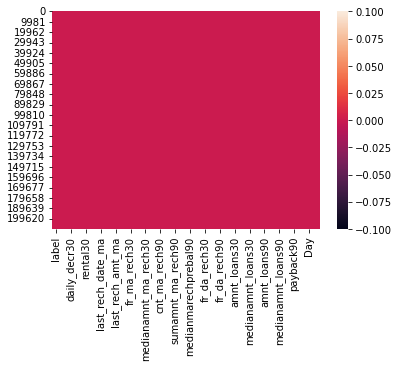

In [13]:
sns.heatmap(df.isnull())  #plotting the null values

### Target variable countplot

<AxesSubplot:xlabel='label', ylabel='count'>

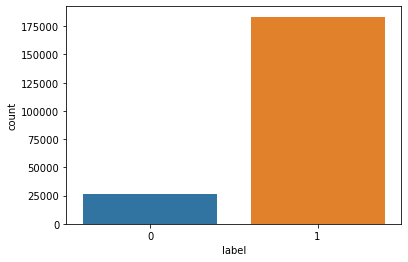

In [14]:
sns.countplot(df['label'])

The dataset is imbalanced. Label ‘1’ has approximately 87.5% records, while, label ‘0’ has approximately 12.5% records.

In [15]:
#separating the dependent & independent variable

x=df.iloc[:,1:]
y=df.iloc[:,0]

### SMOTE 

In [16]:
#balancing the data using SMOTE

from imblearn.over_sampling import SMOTE
smt= SMOTE(random_state=0,k_neighbors=1)
train_x,train_y=smt.fit_resample(x,y)
train_y.value_counts()

0    183431
1    183431
Name: label, dtype: int64

In [17]:
# putting the balanced dataset into a dataframe

df_new=pd.DataFrame(data=train_x)
df_new['label']=train_y
df=df_new
df.shape

(366862, 36)

### Visualizations

<AxesSubplot:xlabel='aon', ylabel='label'>

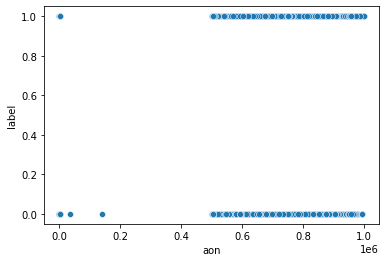

In [18]:
sns.scatterplot(df['aon'],df['label'])

The data is on higher side

<AxesSubplot:xlabel='Day', ylabel='label'>

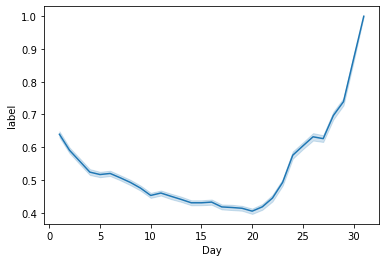

In [19]:
sns.lineplot(df['Day'],df['label'])

We have moreover the defaulters in the middle on the month.

<AxesSubplot:xlabel='Day', ylabel='cnt_loans90'>

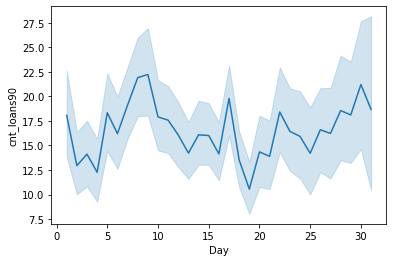

In [20]:
sns.lineplot(df['Day'],df['cnt_loans90'])

The count of loans over the 90 days w.r.t day of a month is varying. It is increasing and decreasing graph during the whole month and have many peaks & lows. 

<AxesSubplot:xlabel='Day', ylabel='cnt_loans30'>

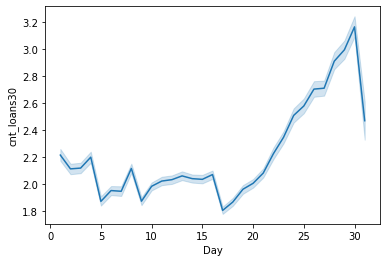

In [21]:
sns.lineplot(df['Day'],df['cnt_loans30'])

During last days of the month the count of credit increase sharply

<AxesSubplot:xlabel='amnt_loans90', ylabel='Density'>

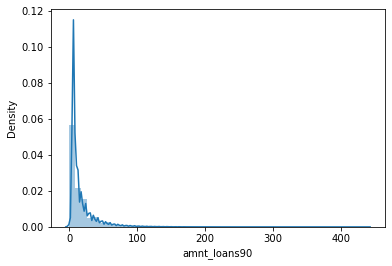

In [22]:
sns.distplot(df['amnt_loans90'])

<AxesSubplot:xlabel='amnt_loans30', ylabel='Density'>

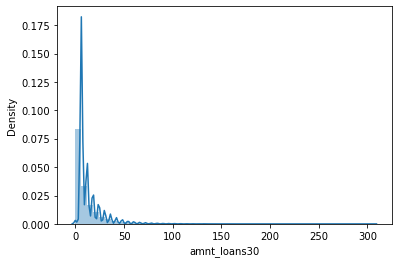

In [23]:
sns.distplot(df['amnt_loans30'])

<AxesSubplot:xlabel='cnt_ma_rech30', ylabel='label'>

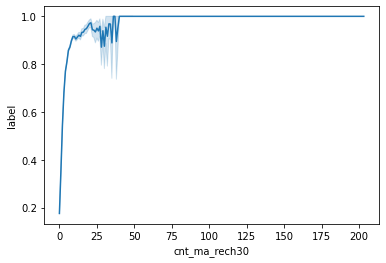

In [24]:
sns.lineplot(df['cnt_ma_rech30'],df['label'])

Peoples whose count of main account recharge over 30 days is on higher side are non-defaulters but with lower number are in the defaulters list

<AxesSubplot:xlabel='rental30', ylabel='Density'>

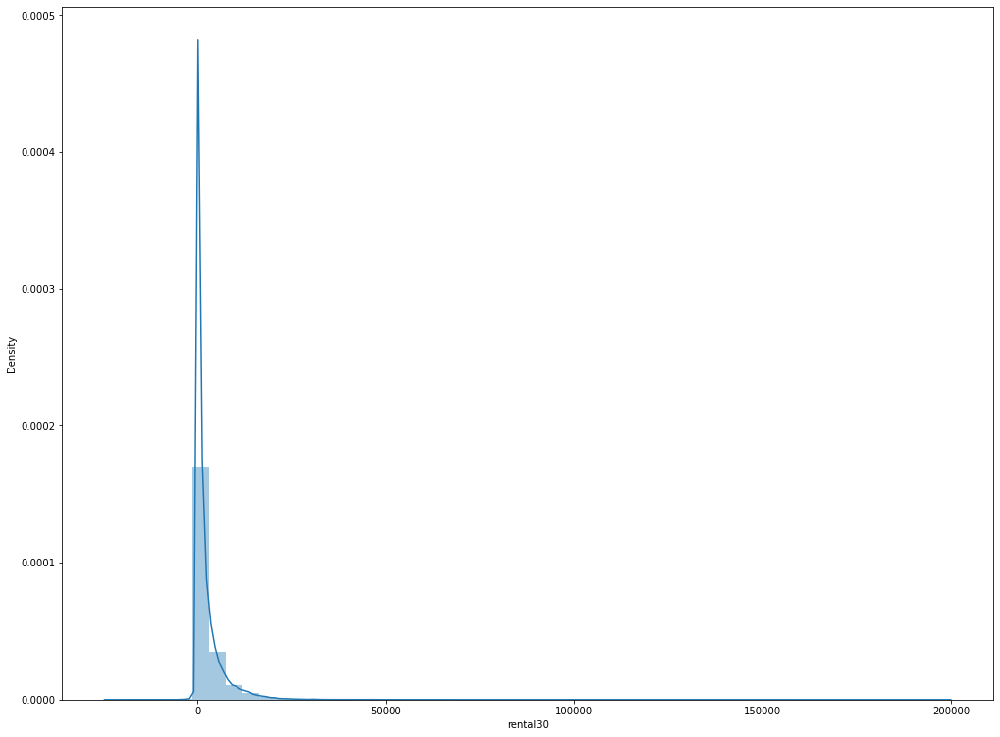

In [25]:
plt.figure(figsize=(17,13))
sns.distplot(df['rental30'])

The avg main account balance over the 30 days is lie between 0 to 50000 only

<AxesSubplot:xlabel='rental90', ylabel='Density'>

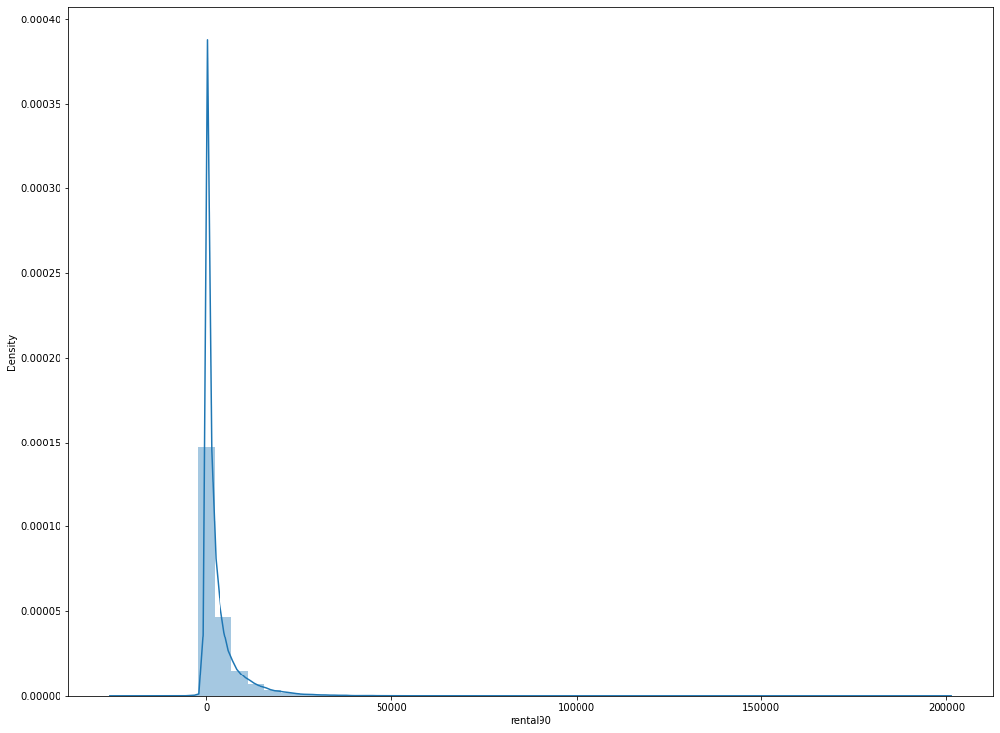

In [26]:
plt.figure(figsize=(17,13))
sns.distplot(df['rental90'])

The avg main account balance over the 90 days is lie between 0 to 50000 only

<AxesSubplot:xlabel='daily_decr30', ylabel='label'>

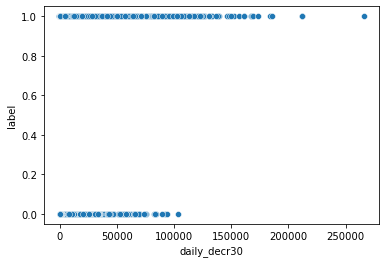

In [27]:
sns.scatterplot(df['daily_decr30'],df['label'])

Defaulters daily spent from the main account is max upto 100000 but it is higher for non-defaulters over the 30 days

<AxesSubplot:xlabel='daily_decr90', ylabel='label'>

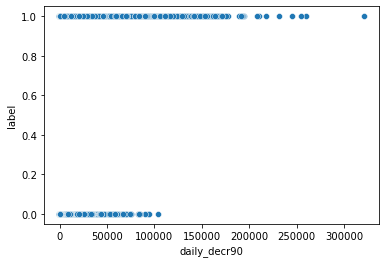

In [28]:
sns.scatterplot(df['daily_decr90'],df['label'])

Defaulters daily spent from the main account is max upto 100000 but it is higher for non-defaulters over the 90 days

<AxesSubplot:xlabel='last_rech_date_ma', ylabel='label'>

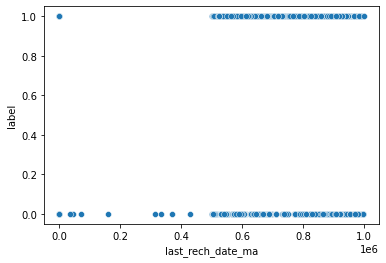

In [29]:
sns.scatterplot(df['last_rech_date_ma'],df['label'])

<AxesSubplot:xlabel='last_rech_date_da', ylabel='label'>

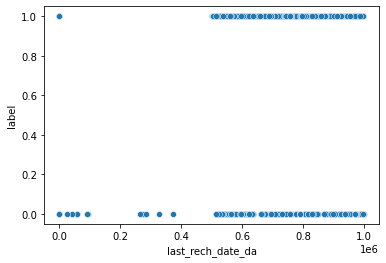

In [30]:
sns.scatterplot(df['last_rech_date_da'],df['label'])

<AxesSubplot:xlabel='last_rech_amt_ma', ylabel='label'>

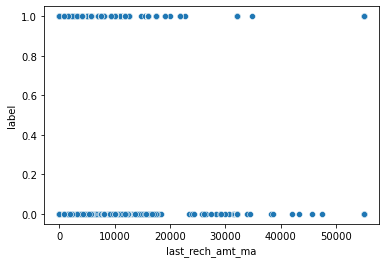

In [31]:
sns.scatterplot(df['last_rech_amt_ma'],df['label'])

Defaulters last main account recharge amount is 0 to 40000 but for non defaulters it is 0 to 20000

<AxesSubplot:xlabel='fr_ma_rech30', ylabel='label'>

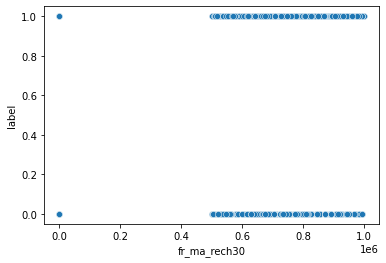

In [32]:
sns.scatterplot(df['fr_ma_rech30'],df['label'])

Frequency of main account recharge is on higher side

<AxesSubplot:xlabel='cnt_ma_rech90', ylabel='label'>

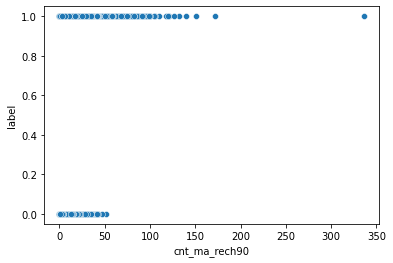

In [33]:
sns.scatterplot(df['cnt_ma_rech90'],df['label'])

The count of the main account recharge over the 90 days is low for defaulters(0-50) & but for non-defaulters it is upto 150

<AxesSubplot:xlabel='fr_ma_rech90', ylabel='label'>

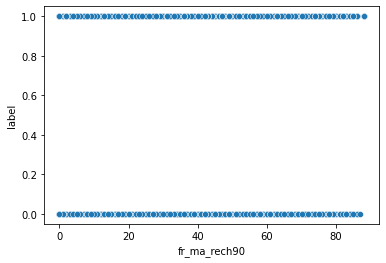

In [34]:
sns.scatterplot(df['fr_ma_rech90'],df['label'])

The data is distributed over the range. Frequency of main recharge account is rqually distributed for defaulyters as well as non-defaulters

<AxesSubplot:xlabel='cnt_da_rech30', ylabel='label'>

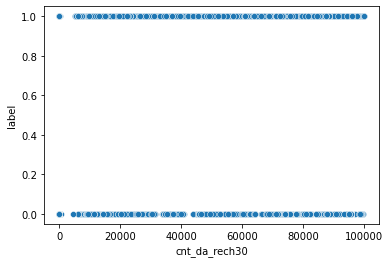

In [35]:
sns.scatterplot(df['cnt_da_rech30'],df['label'])

We have distributed data over the whole range of data. The count od data recharge account is very high over the 30 days

<AxesSubplot:xlabel='fr_da_rech30', ylabel='label'>

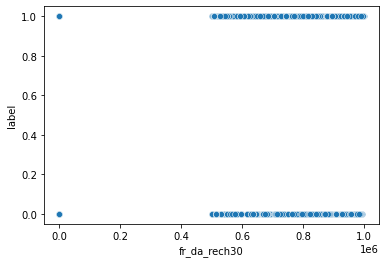

In [36]:
sns.scatterplot(df['fr_da_rech30'],df['label'])

We have the data is on higher side i.e frequency is high over 30 days

<AxesSubplot:xlabel='cnt_da_rech90', ylabel='label'>

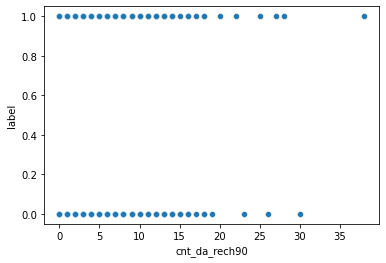

In [37]:
sns.scatterplot(df['cnt_da_rech90'],df['label'])

We have the distributed data over the range of 0 to 20 i.e. data recharge account count is distributed over defaulters or non-defaulters

<AxesSubplot:xlabel='fr_da_rech90', ylabel='label'>

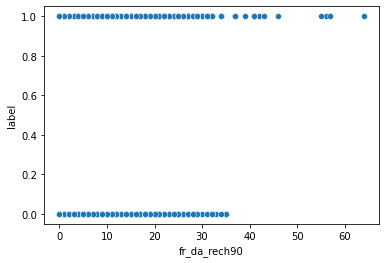

In [38]:
sns.scatterplot(df['fr_da_rech90'],df['label'])

defaulters have very low frequency of data recharging over 90 days

<AxesSubplot:xlabel='cnt_loans30', ylabel='label'>

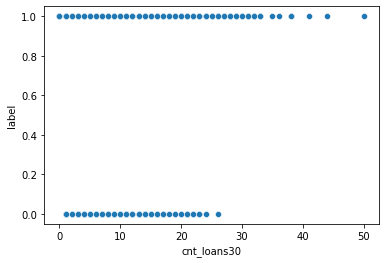

In [39]:
sns.scatterplot(df['cnt_loans30'],df['label'])

Person whose loan count is low is in deafulter list and ahve the outlers in it.

<AxesSubplot:xlabel='amnt_loans30', ylabel='label'>

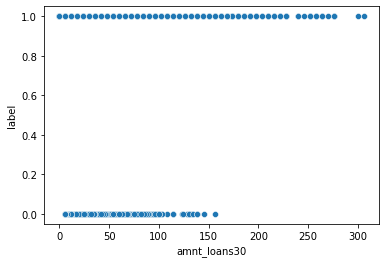

In [40]:
sns.scatterplot(df['amnt_loans30'],df['label'])

Here, a person with high loan amount is out of rist i.e non defaulter but with low amount is at risk i.e. defaulter

<AxesSubplot:xlabel='maxamnt_loans30', ylabel='label'>

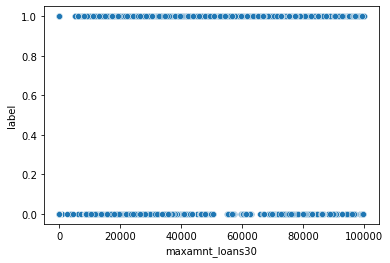

In [41]:
sns.scatterplot(df['maxamnt_loans30'],df['label'])

We have distributed data in this case. Either a person maximum amount value is low or high doen't affect too much its defaultibility nature over the last 30 days

<AxesSubplot:xlabel='cnt_loans90', ylabel='label'>

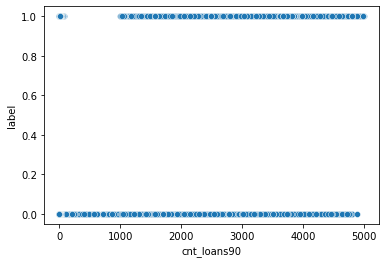

In [43]:
sns.scatterplot(df['cnt_loans90'],df['label'])

We have a distributed data in between 1000 to 5000

<AxesSubplot:xlabel='amnt_loans90', ylabel='label'>

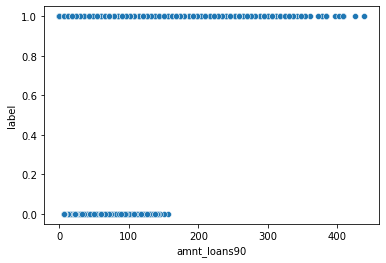

In [44]:
sns.scatterplot(df['amnt_loans90'],df['label'])

Peoples with high loan of amount are not in defaulter list but the ones who has an amount between 0 to 200 are in defaulter count

<AxesSubplot:xlabel='maxamnt_loans90', ylabel='label'>

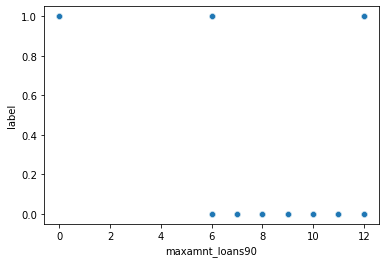

In [45]:
sns.scatterplot(df['maxamnt_loans90'],df['label'])

Peoples who takes a very high number of credit over last 90 days are in the deafulters list, a very few are there who are out of it.

<AxesSubplot:xlabel='payback30', ylabel='Density'>

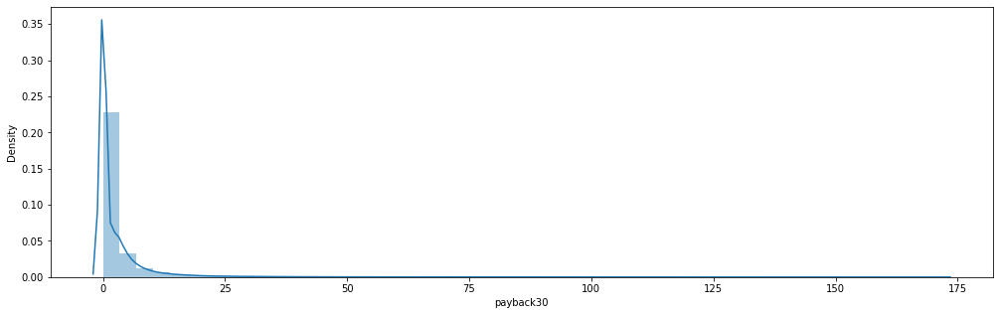

In [52]:
plt.figure(figsize=(17,5))
sns.distplot(df['payback30'],bins=50)

The paybacks over a 30 day cycle is on the earler side

<AxesSubplot:ylabel='Density'>

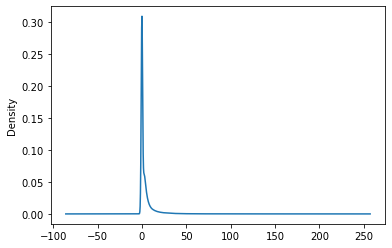

In [51]:
df['payback90'].plot(kind='kde')

Most of the payback has done in the early days

<AxesSubplot:xlabel='Month', ylabel='cnt_loans90'>

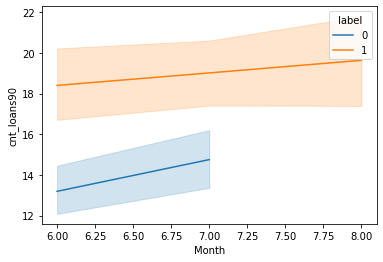

In [21]:
sns.lineplot(df['Month'],df['cnt_loans90'],hue=df['label'])

We have defaulters in 6th & 7th month whose total count of lons over 90 days around 12 to 16

### Statistical Summary

In [22]:
df.describe()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Month,Day,Year,label
count,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.000000,366862.0,366862.000000
mean,8353.341632,3606.937042,4010.135080,2402.875112,2977.747766,3400.343847,3739.374889,1703.388909,2.798742,3646.934915,5351.029446,1473.390605,4019.709395,4.337192,6.393987,8423.146584,1573.549892,73.079968,241.442683,3744.582147,0.031816,0.046811,2.129147,13.988849,269.880796,0.043050,16.413730,17.557185,6.486235,0.038002,2.910178,3.723293,6.647985,14.126162,2016.0,0.500000
std,77171.711019,7534.692924,8824.656092,4076.625836,5219.996216,51109.131274,53619.690818,2279.699716,3.703539,52819.799283,8627.205897,1998.266543,55189.719822,6.137810,11.832539,14106.888763,2049.530892,410.825335,3984.412083,54021.924106,0.361901,0.874307,2.145688,14.558653,4203.560209,0.184608,213.289004,21.871216,1.721124,0.171667,8.673164,10.033106,0.670702,7.812802,0.0,0.500001
min,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,2016.0,0.000000
25%,217.270114,12.873338,13.106781,171.250000,184.673295,1.000000,0.000000,770.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,772.000000,770.000000,2.466700,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,6.000000,8.000000,2016.0,0.000000
50%,471.613346,519.995322,526.000000,869.560000,1017.867085,3.000000,0.000000,947.000000,2.000000,0.000000,2313.000000,773.000000,23.000000,2.000000,1.000000,3463.000000,947.000000,26.020061,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.336705,9.000000,6.000000,0.000000,0.000000,0.000000,7.000000,14.000000,2016.0,0.500000
75%,903.000000,3811.547200,3921.205477,2862.284364,3491.885000,8.000000,0.000000,1547.000000,4.000000,4.000000,6948.000000,1541.917230,62.200000,6.000000,7.000000,10234.000000,1547.000000,62.500000,0.000000,0.000000,0.000000,0.000000,2.000000,18.000000,6.000000,0.000000,3.000000,18.000000,6.000000,0.000000,2.883971,3.600000,7.000000,20.000000,2016.0,1.000000
max,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.000000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240107,38.000000,64.000000,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000,8.000000,31.000000,2016.0,1.000000


Observations Made
- Now, we have 366862 rows after using the smote
- There is very larrge difference between the 75% and max value, means outliers are present in the dataset
- We have negative values also as our min value
- Some columns have difference between the mean, median, std so we can say that skewness is also present in the dataset

### Correlation

In [23]:
corr=df.corr()
corr

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Month,Day,Year,label
aon,1.000000,-0.002630,-0.002785,-0.009281,-0.008683,-0.000829,-0.004128,-0.001496,-0.007890,-0.003684,-0.001919,0.001696,0.000818,-0.007320,0.001485,-0.002422,0.001075,-0.001369,-0.001531,-0.002105,0.001141,0.006925,-0.004834,-0.004551,-0.003761,0.006836,0.001953,-0.004445,-0.004217,0.005842,0.000211,0.000187,-0.019005,-0.001900,NaN,-0.004525
daily_decr30,-0.002630,1.000000,0.979945,0.386044,0.418857,0.000417,-0.002329,0.293017,0.504323,0.001031,0.659997,0.312822,-0.003182,0.620878,-0.002035,0.772356,0.270293,0.044196,0.000272,-0.001072,0.056861,0.020068,0.426191,0.516856,-0.001038,0.012154,0.008806,0.598238,0.423036,-0.013978,0.059614,0.080182,0.526546,0.020560,NaN,0.313287
daily_decr90,-0.002785,0.979945,1.000000,0.378815,0.427874,0.001035,-0.002377,0.280455,0.482104,0.001065,0.631159,0.299503,-0.002700,0.625268,-0.006707,0.777584,0.260943,0.042871,0.000519,-0.001123,0.048586,0.016321,0.403499,0.495668,-0.000813,0.016589,0.009358,0.601636,0.418298,-0.012438,0.051091,0.071925,0.539068,-0.001425,NaN,0.312478
rental30,-0.009281,0.386044,0.378815,1.000000,0.964804,-0.003005,0.003249,0.146020,0.212955,-0.002540,0.252577,0.154403,-0.003165,0.273566,0.007924,0.303393,0.140319,0.057094,-0.005728,-0.004726,0.093149,0.065507,0.168475,0.213736,-0.002840,-0.006786,0.000414,0.264469,0.227258,-0.023638,0.084019,0.107164,0.363329,0.054164,NaN,0.094250
rental90,-0.008683,0.418857,0.427874,0.964804,1.000000,-0.002650,0.002900,0.146448,0.227480,-0.001751,0.257354,0.150311,-0.002704,0.318197,0.008927,0.335468,0.137027,0.053769,-0.004341,-0.004466,0.079479,0.056375,0.177063,0.228080,-0.002874,-0.000134,0.002218,0.304713,0.249391,-0.022174,0.081203,0.112356,0.423464,0.034967,NaN,0.128398
last_rech_date_ma,-0.000829,0.000417,0.001035,-0.003005,-0.002650,1.000000,0.000023,-0.003165,0.003017,-0.002236,0.001889,-0.003274,0.001248,0.004423,-0.003032,0.002509,-0.003351,-0.001187,-0.003456,-0.003872,-0.003373,-0.002933,0.003920,0.003491,0.000404,0.003610,0.017803,0.003241,-0.000506,0.004906,-0.002556,-0.003297,-0.008061,0.003706,NaN,0.008441
last_rech_date_da,-0.004128,-0.002329,-0.002377,0.003249,0.002900,0.000023,1.000000,-0.003317,-0.004027,-0.000657,-0.002196,-0.002463,-0.000695,-0.003440,0.001116,-0.002854,-0.003006,0.004161,-0.003785,-0.002130,-0.001951,-0.001787,-0.001844,-0.001948,0.003313,-0.001391,-0.002319,-0.001464,-0.000395,-0.002810,-0.004335,-0.004165,-0.013155,0.003945,NaN,0.000136
last_rech_amt_ma,-0.001496,0.293017,0.280455,0.146020,0.146448,-0.003165,-0.003317,1.000000,0.097855,0.000036,0.472022,0.804255,-0.000417,0.108742,0.135978,0.446227,0.857036,0.102360,-0.003339,-0.001610,0.027239,0.020395,0.055523,0.084052,-0.003465,0.046097,-0.000179,0.086574,0.160958,0.038382,0.012058,0.025649,0.149784,0.046865,NaN,0.210148
cnt_ma_rech30,-0.007890,0.504323,0.482104,0.212955,0.227480,0.003017,-0.004027,0.097855,1.000000,-0.000362,0.701360,0.108718,-0.003072,0.903650,-0.027976,0.638253,0.057321,0.036948,0.000647,-0.002632,0.025013,0.008283,0.791522,0.782639,-0.003252,-0.020115,0.014196,0.724642,0.236352,-0.029138,0.102557,0.084382,0.243120,0.081339,NaN,0.421432
fr_ma_rech30,-0.003684,0.001031,0.001065,-0.002540,-0.001751,-0.002236,-0.000657,0.000036,-0.000362,1.000000,0.001875,-0.000533,-0.000023,0.000468,0.000530,0.001152,-0.001959,-0.002457,0.000175,-0.002971,0.006119,-0.002473,0.002133,0.002841,-0.002394,-0.002352,0.001979,0.003172,-0.001508,-0.003004,0.004469,0.001916,-0.009097,0.002423,NaN,0.002222


<AxesSubplot:>

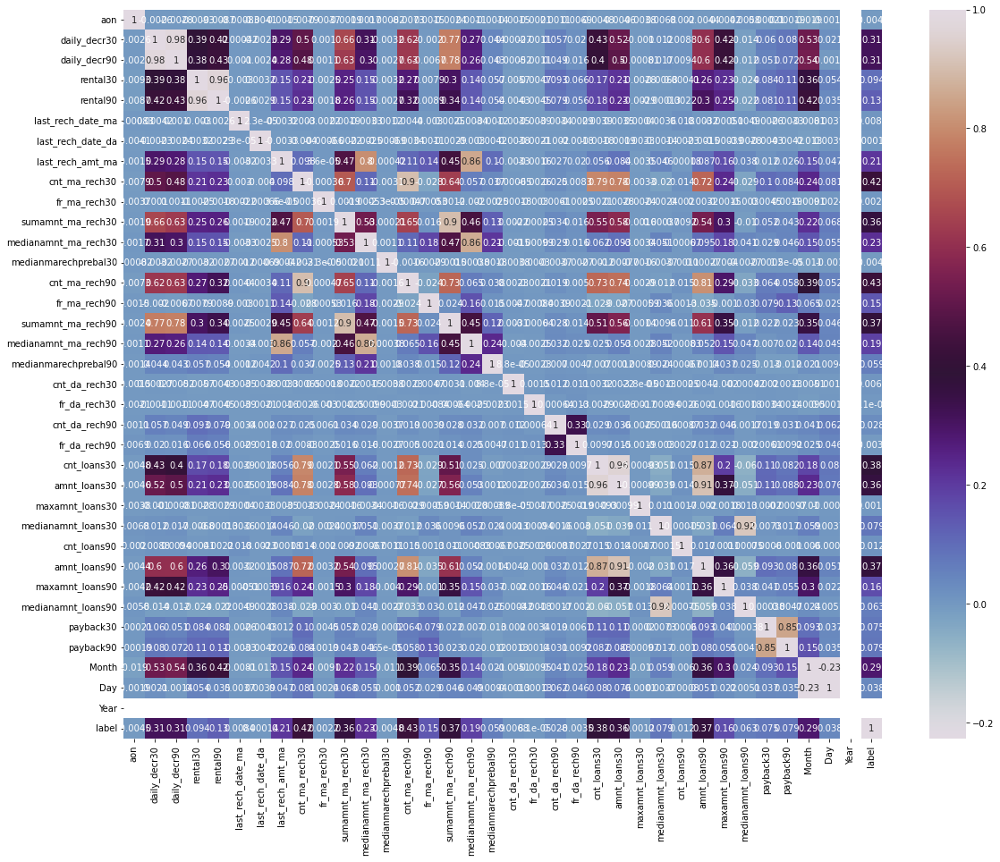

In [24]:
plt.figure(figsize=(19,15))
sns.heatmap(corr,annot=True,cmap='twilight')

In [25]:
corr['label'].sort_values()  #sorting the correlation values with our target variable

medianmarechprebal30   -0.004825
aon                    -0.004525
fr_da_rech90           -0.003482
fr_da_rech30            0.000081
last_rech_date_da       0.000136
maxamnt_loans30         0.001231
fr_ma_rech30            0.002222
cnt_da_rech30           0.006822
last_rech_date_ma       0.008441
cnt_loans90             0.011763
cnt_da_rech90           0.027989
Day                     0.037698
medianmarechprebal90    0.059455
medianamnt_loans90      0.062824
payback30               0.074891
payback90               0.078705
medianamnt_loans30      0.079359
rental30                0.094250
rental90                0.128398
fr_ma_rech90            0.145702
maxamnt_loans90         0.164866
medianamnt_ma_rech90    0.188364
last_rech_amt_ma        0.210148
medianamnt_ma_rech30    0.225237
Month                   0.287346
daily_decr90            0.312478
daily_decr30            0.313287
amnt_loans30            0.361159
sumamnt_ma_rech30       0.362825
amnt_loans90            0.369683
sumamnt_ma

In [26]:
df.drop('Year',axis=1,inplace=True)  #dropping the year column as it containd the same value throughout the dataset & is not correlates with our target variable

#### Plotting the outliers

aon                        AxesSubplot(0.125,0.808774;0.168478x0.0712264)
daily_decr30            AxesSubplot(0.327174,0.808774;0.168478x0.0712264)
daily_decr90            AxesSubplot(0.529348,0.808774;0.168478x0.0712264)
rental30                AxesSubplot(0.731522,0.808774;0.168478x0.0712264)
rental90                   AxesSubplot(0.125,0.723302;0.168478x0.0712264)
last_rech_date_ma       AxesSubplot(0.327174,0.723302;0.168478x0.0712264)
last_rech_date_da       AxesSubplot(0.529348,0.723302;0.168478x0.0712264)
last_rech_amt_ma        AxesSubplot(0.731522,0.723302;0.168478x0.0712264)
cnt_ma_rech30               AxesSubplot(0.125,0.63783;0.168478x0.0712264)
fr_ma_rech30             AxesSubplot(0.327174,0.63783;0.168478x0.0712264)
sumamnt_ma_rech30        AxesSubplot(0.529348,0.63783;0.168478x0.0712264)
medianamnt_ma_rech30     AxesSubplot(0.731522,0.63783;0.168478x0.0712264)
medianmarechprebal30       AxesSubplot(0.125,0.552358;0.168478x0.0712264)
cnt_ma_rech90           AxesSubplot(0.

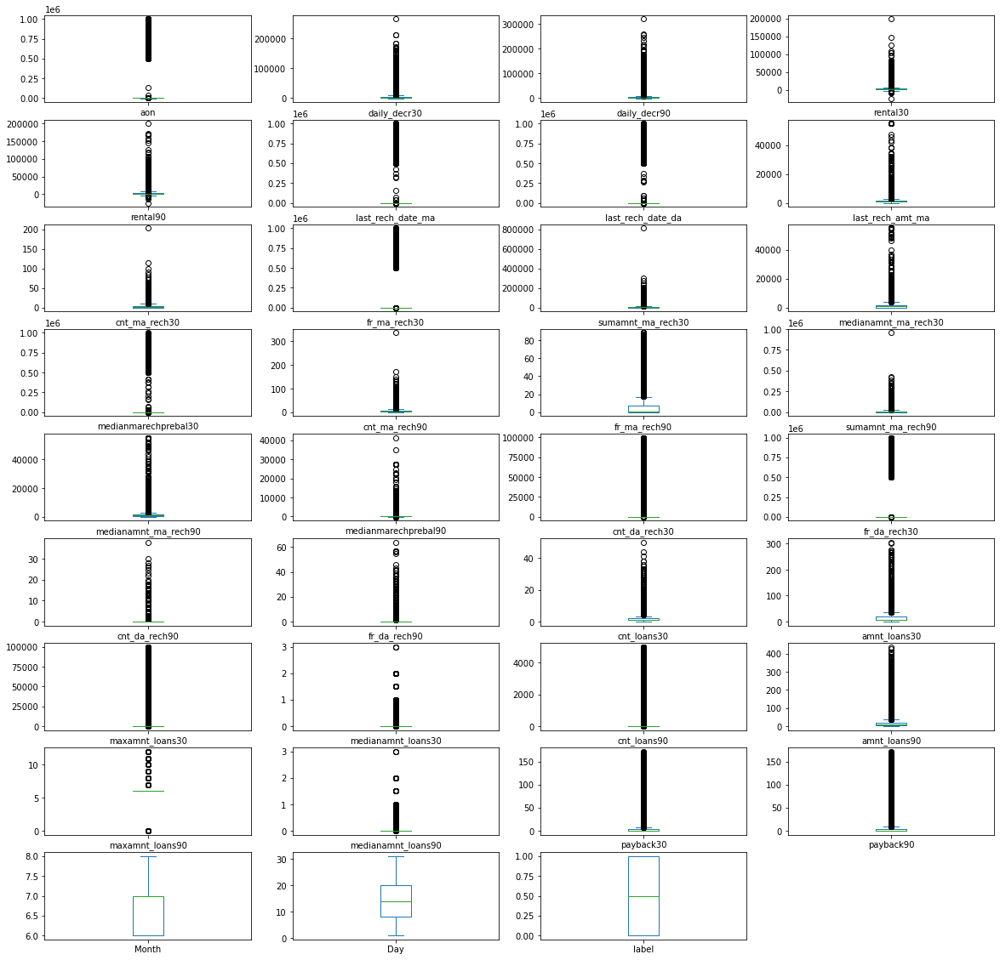

In [27]:
 df.plot(kind='box',subplots=True,layout=(9,4),figsize=(20,20))

We have outliers in the dataset which has to be handled

### Checking the skewness

In [28]:
df.skew()

aon                     10.174820
daily_decr30             4.863128
daily_decr90             5.289449
rental30                 4.458387
rental90                 4.539168
last_rech_date_ma       15.536263
last_rech_date_da       14.767952
last_rech_amt_ma         5.250638
cnt_ma_rech30            3.635546
fr_ma_rech30            14.891648
sumamnt_ma_rech30        6.797732
medianamnt_ma_rech30     4.957967
medianmarechprebal30    14.396872
cnt_ma_rech90            3.925368
fr_ma_rech90             2.534718
sumamnt_ma_rech90        5.573501
medianamnt_ma_rech90     5.133515
medianmarechprebal90    48.468498
cnt_da_rech30           18.573896
fr_da_rech30            14.836054
cnt_da_rech90           28.963198
fr_da_rech90            27.369534
cnt_loans30              3.422823
amnt_loans30             3.653298
maxamnt_loans30         17.888126
medianamnt_loans30       5.076327
cnt_loans90             17.243716
amnt_loans90             3.924985
maxamnt_loans90          2.352118
medianamnt_loa

columns contains the skewness which has to be handled

In [29]:
#removing the skewness

from sklearn.preprocessing import power_transform
df_new=power_transform(df)
df=pd.DataFrame(df_new,columns=df.columns)
df.skew()

aon                     1.742309e+00
daily_decr30           -1.427648e+01
daily_decr90           -1.504380e+01
rental30               -1.370846e+00
rental90               -1.372185e+00
last_rech_date_ma      -7.570481e+00
last_rech_date_da      -1.369387e+02
last_rech_amt_ma       -3.473579e-01
cnt_ma_rech30           5.955650e-02
fr_ma_rech30            4.208985e-01
sumamnt_ma_rech30      -3.712343e-01
medianamnt_ma_rech30   -4.173060e-01
medianmarechprebal30   -1.100959e+00
cnt_ma_rech90           5.290889e-02
fr_ma_rech90            3.220688e-01
sumamnt_ma_rech90      -3.186387e-01
medianamnt_ma_rech90   -3.591985e-01
medianmarechprebal90    7.895651e+00
cnt_da_rech30           6.638223e+00
fr_da_rech30            1.060484e+01
cnt_da_rech90           7.215972e+00
fr_da_rech90            1.338517e+01
cnt_loans30            -1.488295e-02
amnt_loans30           -9.973696e-02
maxamnt_loans30        -2.308240e+00
medianamnt_loans30      3.431814e+00
cnt_loans90             2.184385e-01
a

In [30]:
#removing the outliers from the data

from scipy.stats import zscore
z=np.abs(zscore(df))
threshold=3
print(np.where(z>3))
df_new=df[(z<3).all(axis=1)]
df=df_new
df.shape

(array([     7,     24,     24, ..., 366852, 366852, 366852], dtype=int64), array([20,  3,  4, ...,  4, 25, 29], dtype=int64))


(302199, 35)

In [31]:
#scaling the data

from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-0.10357685, -0.25229941, -0.27634619, ...,  0.27336037,
         0.6637208 ,  0.        ],
       [-0.09776412,  0.73103667,  0.5533797 , ...,  1.62209905,
        -0.52127058,  0.        ],
       [-0.10010243, -0.43201111, -0.42903256, ...,  1.62209905,
         0.54522166,  0.        ],
       ...,
       [-0.09378769,  0.70079045,  0.53319431, ...,  0.27336037,
         1.73021304,  0.        ],
       [-0.08428915,  0.77075515,  0.59455827, ...,  0.27336037,
         1.25621649,  0.        ],
       [-0.08628398, -0.09674426, -0.14174607, ...,  0.27336037,
        -0.87676799,  0.        ]])

In [32]:
df.shape  #checking the shape after removing the outliers and we don't have lost too much data

(302199, 35)

### Model Building

In [33]:
#importing the different machine learning models

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [34]:
#defining the models 

lg=LogisticRegression()
rdc=RandomForestClassifier()
dtc=DecisionTreeClassifier()
knc=KNeighborsClassifier()

#### Finding the best random state

In [35]:
model=[lg,rdc,svc,dtc,knc]
maxAccu=0
bestRS=0
for i in range(40,60):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=.30)
    lg.fit(x_train,y_train)
    pred=lg.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        bestRS=i
print('Best Accuracy score is', maxAccu , 'on random state', bestRS)

Best Accuracy score is 0.8794013804510321 on random state 51


In [36]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=51,test_size=.30)

#### Logistic regression

In [37]:
lg.fit(x_train,y_train)
pred=lg.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.8794013804510321
Confusion Matrix:  
 [[  269  7456]
 [  127 55026]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.68      0.03      0.07      7725
           1       0.88      1.00      0.94     55153

    accuracy                           0.88     62878
   macro avg       0.78      0.52      0.50     62878
weighted avg       0.86      0.88      0.83     62878



#### Decision Tree Classifier

In [38]:
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.886876172906263
Confusion Matrix:  
 [[ 4351  3374]
 [ 3739 51414]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.54      0.56      0.55      7725
           1       0.94      0.93      0.94     55153

    accuracy                           0.89     62878
   macro avg       0.74      0.75      0.74     62878
weighted avg       0.89      0.89      0.89     62878



#### Random Forest Classifier

In [39]:
rdc.fit(x_train,y_train)
pred=rdc.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.9220872165145202
Confusion Matrix:  
 [[ 3959  3766]
 [ 1133 54020]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.78      0.51      0.62      7725
           1       0.93      0.98      0.96     55153

    accuracy                           0.92     62878
   macro avg       0.86      0.75      0.79     62878
weighted avg       0.92      0.92      0.91     62878



#### Kneighbor Classifier

In [40]:
knc.fit(x_train,y_train)
pred=knc.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.8904545309965329
Confusion Matrix:  
 [[ 3243  4482]
 [ 2406 52747]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.57      0.42      0.48      7725
           1       0.92      0.96      0.94     55153

    accuracy                           0.89     62878
   macro avg       0.75      0.69      0.71     62878
weighted avg       0.88      0.89      0.88     62878



#### Gaussian NB 

In [43]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(x_train,y_train)
pred=gnb.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.5920671777092147
Confusion Matrix:  
 [[ 6720  1005]
 [24645 30508]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.21      0.87      0.34      7725
           1       0.97      0.55      0.70     55153

    accuracy                           0.59     62878
   macro avg       0.59      0.71      0.52     62878
weighted avg       0.88      0.59      0.66     62878



#### SGD Classifier

In [44]:
from sklearn.linear_model import SGDClassifier
sgd=SGDClassifier()
sgd.fit(x_train,y_train)
pred=sgd.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy Score: ',acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred))
print('Classification Report: ','\n',classification_report(y_test,pred))

Accuracy Score:  0.8763160405865327
Confusion Matrix:  
 [[    8  7717]
 [   60 55093]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.12      0.00      0.00      7725
           1       0.88      1.00      0.93     55153

    accuracy                           0.88     62878
   macro avg       0.50      0.50      0.47     62878
weighted avg       0.78      0.88      0.82     62878



### Cross Val Score

In [45]:
from sklearn.model_selection import cross_val_score
for i in range(3,7):
    cr=cross_val_score(rdc,x,y,cv=i)
    cr_mean=cr.mean()
    print("at cv= ", i)
    print('cross val score = ',cr_mean*100)

at cv=  3
cross val score =  92.09801871334051
at cv=  4
cross val score =  92.12282863375371
at cv=  5
cross val score =  92.10660693821755
at cv=  6
cross val score =  92.14954605860824


### Hypermeter Tuning

In [47]:
from sklearn.model_selection import GridSearchCV
# creating parameters
param={'criterion':['gini','entropy'],
      'max_features':['sqrt','log2','auto'],
      'max_depth':[2,3,4,5]}

GCV=GridSearchCV(rdc,param,cv=6,scoring='accuracy')
GCV.fit(x_train,y_train)
GCV.best_params_

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt'}

In [48]:
GCV_pred=GCV.best_estimator_.predict(x_test)
accuracy_score(y_test,GCV_pred)

0.9025255256210439

### AUC ROC Curve

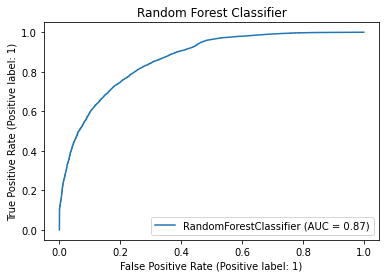

In [49]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(GCV.best_estimator_,x_test,y_test)
plt.title('Random Forest Classifier')
plt.show()

### Saving the model

In [50]:
import pickle
filename='micro_credit.pkl'
pickle.dump(lg, open(filename,'wb'))

### Conclusion

In [52]:
a=np.array(y_test)
pred=np.array(GCV_pred)
micro_credit=pd.DataFrame({'Actual':a,'Predicted':pred})
micro_credit

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,0,1
9,1,1


Here, we check the actual values versus predicted values to have a lookon our model and somehow we got an idea that our model predicts well.